In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Data Source and Contents

In [31]:
census = pd.read_csv('https://github.com/ArinB/MSBA-CA-03-Decision-Trees/blob/master/census_data.csv?raw=true')
#read the data and label it 'census'
census.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


# 2. Data Quality Analysis (DQA)

In [32]:
census.info()
#this shows the non-null records and the range of the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
hours_per_week_bin    48842 non-null object
occupation_bin        48842 non-null object
msr_bin               48842 non-null object
capital_gl_bin        48842 non-null object
race_sex_bin          48842 non-null object
education_num_bin     48842 non-null object
education_bin         48842 non-null object
workclass_bin         48842 non-null object
age_bin               48842 non-null object
flag                  48842 non-null object
y                     48842 non-null int64
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [33]:
display(census.describe(exclude='int'))
#this shows the descriptive statistics of each column, excluding the integer. which would be 'y' column
display(census.describe())
#this shows the 'y' column descriptive statistics

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842
unique,5,5,3,3,3,5,5,2,5,2
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561


,y
count,48842.000000
mean,0.239282
std,0.426649
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


# 3. Exploratory Data Analysis (EDA)

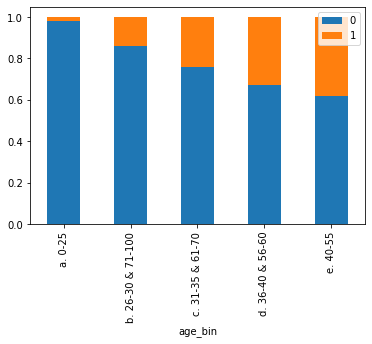

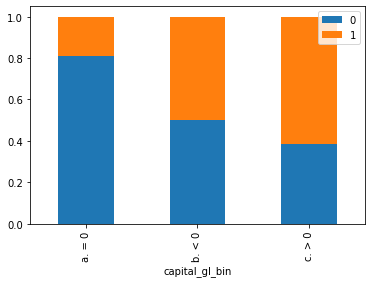

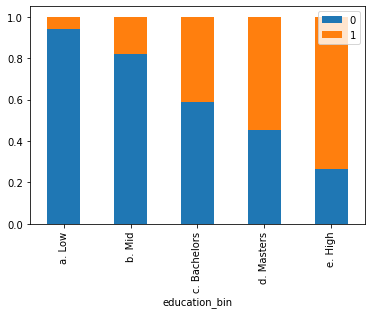

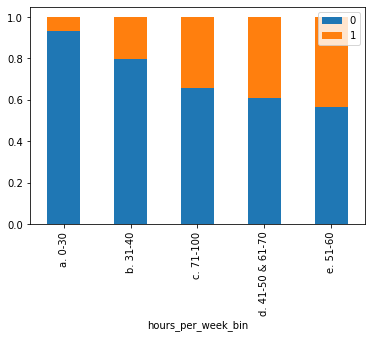

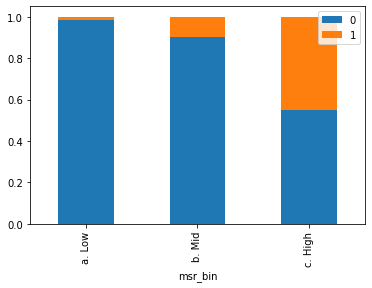

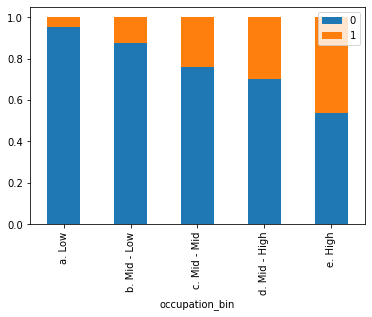

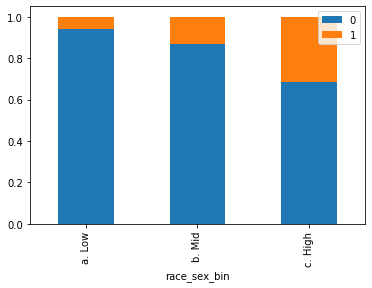

In [34]:
def barchart(column):
  group = pd.pivot_table(census,values='flag',columns='y',index=column, aggfunc='count', margins=True)
  group['0'] = group.iloc[:-1,0]/group.iloc[:-1,2]
  group['1'] = group.iloc[:-1,1]/group.iloc[:-1,2]
  return group.iloc[:-1,-2:]
#this function defines barchart to pivot by 'flag'(for train/test) and by 'y'(for 0/1) then uses count
#the numbers in each respective groups are further normalized as percentage to create percentage stacked bar chart

barchart('age_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('capital_gl_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('education_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('hours_per_week_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('msr_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('occupation_bin').plot.bar(stacked=True).legend(labels=(0,1))
barchart('race_sex_bin').plot.bar(stacked=True).legend(labels=(0,1))
#using the function made above, the stacked barcharts are made with each column and the legends shown

# 4. Build Decision Tree Classifier Models

In [35]:
from sklearn.tree import DecisionTreeClassifier

variables = ['age_bin', 'capital_gl_bin', 'education_bin', 'hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin']
#set the variables to include most variables (exlude 'y' and 'flag' when using loc)

x_train = census.loc[census['flag']=='train',variables]
y_train = census.loc[census['flag']=='train','y']
x_train = pd.get_dummies(x_train, columns = variables, drop_first=True)

x_test = census.loc[census['flag']=='test',variables]
y_test = census.loc[census['flag']=='test','y']
x_test = pd.get_dummies(x_test, columns = variables, drop_first=True)
#split to train/test sets and convert categorical variable to dummy variables

dtree = DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 15)
#tune the hyperparameters for the gini decision tree

dtree.fit(x_train, y_train)
#fit the data

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [0]:
y_pred_dtree = dtree.predict(x_test)

# 5. Visualize Your Decision Tree Using GraphViz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.886673 to fit



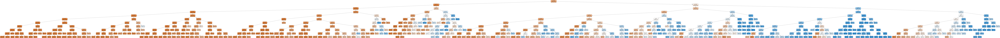

In [37]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
#creates the image of the decision tree

# 6. Evaluate Decision Tree Performance

In [38]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_dtree)
#creates the confusion matrix for the first gini decision tree

array([[11521,   914],
       [ 1653,  2193]])

In [39]:
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report
print(accuracy_score(y_test, y_pred_dtree))
print(classification_report(y_test, y_pred_dtree))
#creates and prints the accuracy score as well as the classification report for first gini tree

0.8423315521159634
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [40]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_dtree)
metrics.auc(fpr, tpr)
#shows the AUC of the first gini tree

0.7483502983062628

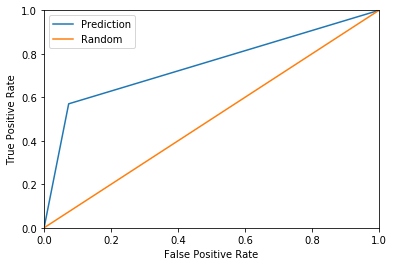

In [41]:
plt.plot(fpr, tpr, label = 'Prediction')
#plots the prediction numbers made by the gini decision tree
plt.plot([0, 1], [0, 1], label = 'Random')
#plots straight diagonal line in graph representing random
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()

# 7. Tune Decision Tree Performance

## Hyperparameter Tuning 1

In [42]:
etree = DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 15)
etree.fit(x_train, y_train)
#makes the first entropy decision tree with same hyperparameters as the first gini tree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [43]:
y_pred_etree = etree.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_etree)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_etree))
print(accuracy_score(y_test, y_pred_etree))
print(classification_report(y_test, y_pred_etree))
#prints the confusion matrix, accuracy score as well as classification report

0.7478021436900901
[[11530   905]
 [ 1660  2186]]
0.8424543946932007
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



## Hyperparameter Tuning 2

In [44]:
dtree2 = DecisionTreeClassifier(criterion='gini', max_depth=20, random_state=101,
                               max_features = None, min_samples_leaf = 15)
dtree2.fit(x_train, y_train)
#second gini decision tree, changes max depth to 20

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [45]:
y_pred_dtree2 = dtree2.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_dtree2)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_dtree2))
print(accuracy_score(y_test, y_pred_dtree2))
print(classification_report(y_test, y_pred_dtree2))
#prints out results, same as previously done

0.7438805344734899
[[11523   912]
 [ 1688  2158]]
0.8403046495915484
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [46]:
etree2 = DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=101,
                               max_features = None, min_samples_leaf = 15)
etree2.fit(x_train, y_train)
#second entropy decision tree with same hyperparameters as second gini tree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [47]:
y_pred_etree2 = etree2.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_etree2)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_etree2))
print(accuracy_score(y_test, y_pred_etree2))
print(classification_report(y_test, y_pred_etree2))
#prints out results, same as previously done

0.7430844447288145
[[11542   893]
 [ 1700  2146]]
0.8407345986118788
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



# Hyperparameter Tuning 3

In [48]:
dtree3 = DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 30)
dtree3.fit(x_train, y_train)
#third gini tree, changes minimum samples for leaf to 30

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [49]:
y_pred_dtree3 = dtree3.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_dtree3)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_dtree3))
print(accuracy_score(y_test, y_pred_dtree3))
print(classification_report(y_test, y_pred_dtree3))
#prints out results, same as previously done

0.7467325568776672
[[11484   951]
 [ 1654  2192]]
0.8399975431484552
              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [50]:
etree3 = DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 30)
etree3.fit(x_train, y_train)
#third entropy tree, same changes as third gini tree

import time
start_time = time.time()
print("--- %s seconds ---" % (time.time() - start_time))
#this calculates the run time needed for the best model

--- 5.626678466796875e-05 seconds ---


In [51]:
y_pred_etree3 = etree3.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_etree3)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_etree3))
print(accuracy_score(y_test, y_pred_etree3))
print(classification_report(y_test, y_pred_etree3))
#print out results, same as previously done

0.7492709985842136
[[11476   959]
 [ 1632  2214]]
0.8408574411891161
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     12435
           1       0.70      0.58      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.84     16281



## Hyperparamter Tuning 4

In [52]:
dtree4 = DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 15, min_samples_split = 6)
dtree4.fit(x_train, y_train)
#fourth gini tree, changes minimum samples to split to 6

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=6,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [53]:
y_pred_dtree4 = dtree4.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_dtree4)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_dtree4))
print(accuracy_score(y_test, y_pred_dtree4))
print(classification_report(y_test, y_pred_dtree4))
#print out results, same as previously done

0.7483502983062628
[[11521   914]
 [ 1653  2193]]
0.8423315521159634
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [54]:
etree4 = DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=101,
                               max_features = None, min_samples_leaf = 15, min_samples_split = 2)
etree4.fit(x_train, y_train)
#fourth entropy tree, same changes as fourth gini tree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=15, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=101, splitter='best')

In [55]:
y_pred_etree4 = etree4.predict(x_test)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_etree4)
print(metrics.auc(fpr, tpr))

print(confusion_matrix(y_test, y_pred_etree4))
print(accuracy_score(y_test, y_pred_etree4))
print(classification_report(y_test, y_pred_etree4))
#print out results, same as previously done

0.7478021436900901
[[11530   905]
 [ 1660  2186]]
0.8424543946932007
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



# 8. Conclusion

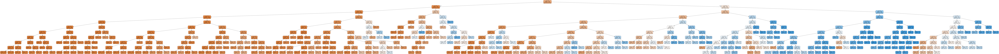

In [56]:
dot_data = StringIO()
export_graphviz(etree3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 9. Automation

In [0]:
def tree(criterion, max_depth, random_state, max_features, min_samples_leaf, min_samples_split):
  dec_tree = DecisionTreeClassifier(criterion = criterion, max_depth = max_depth, random_state = random_state,
                               max_features = max_features, min_samples_leaf = min_samples_leaf, min_samples_split = min_samples_split)
  dec_tree.fit(x_train, y_train)
  y_pred = dec_tree.predict(x_test)
  return print(accuracy_score(y_test, y_pred),
               classification_report(y_test, y_pred))

In [58]:
tree('entropy', 10, 101, None, 30, 2)

0.8408574411891161               precision    recall  f1-score   support

           0       0.88      0.92      0.90     12435
           1       0.70      0.58      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.84     16281

